In [107]:
import anndata
import pixelator
import torch
import scvi
import scipy
# from scvi import autotune

import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm

from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection

# import ray
# from ray import tune

from pathlib import Path


from PixelGen.pxl_utils import train_model, get_model_latents, convert_polarization_to_feature_matrix, \
     convert_colocalization_to_feature_matrix, download_pxl
from PixelGen.scvi_utils import plot_losses, pca_neighbors_umap, calc_PCA, add_one_hot_encoding_obsm

from pixelator.plot import molecule_rank_plot, cell_count_plot, scatter_umi_per_upia_vs_tau
from pixelator.statistics import clr_transformation
from pixelator.analysis.normalization import dsb_normalize


from sklearn.preprocessing import StandardScaler, MinMaxScaler 


import tempfile

from scvi import REGISTRY_KEYS
from scvi.module.base import (
    BaseModuleClass,
    LossOutput,
    PyroBaseModuleClass,
    auto_move_data,
)
from torch.distributions import NegativeBinomial, Normal, Poisson, MixtureSameFamily, Beta
from torch.distributions import kl_divergence as kl

from PixelGen.multimodalvi import MultiModalSCVI
from PixelGen.multimodalvae import MultiModalVAE, AggMethod, D
from PixelGen.enums import AggMethod, D
from PixelGen.metrics import MultiModalVIMetrics

# from cytovi import CytoVI

print(torch.cuda.is_available())


scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
CMAP = 'RdBu_r'
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"
%load_ext autoreload
%autoreload 2

Seed set to 0


True
Last run with scvi-tools version: 1.2.2.post2
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [108]:
DATA_DIR = Path('PixelGen/datasets/cd3-capping')


FILENAMES = [
    "Sample07_pbmc_CD3_capped.layout.dataset.pxl",
    "Sample08_pbmc_CD3_capped.layout.dataset.pxl",
    "Sample01_human_pbmcs_unstimulated.layout.dataset.pxl",
    "Sample02_human_pbmcs_unstimulated.layout.dataset.pxl"
]


SAMPLE_NAMES = [
    "treated_1", 
    "treated_2",
    "control_1",
    "control_2",
]

COMBINED_FILENAME = "cd3_combined.pxl"

COMBINED_PATH = DATA_DIR / COMBINED_FILENAME

pg_data = pixelator.read(COMBINED_PATH)
# adata = pg_data.adata

# Uncomment to download for first time

# BASEURLS = [
#     "https://pixelgen-technologies-datasets.s3.eu-north-1.amazonaws.com/mpx-datasets/pixelator/0.18.x/cd3-capping-v1.0-immunology-I"
# ]*2 + [
#     "https://pixelgen-technologies-datasets.s3.eu-north-1.amazonaws.com/mpx-datasets/pixelator/0.18.x/1k-human-pbmcs-v1.0-immunology-I"
# ]*2

# pg_data = download_pxl(
#     baseurl=BASEURLS,
#     filenames=FILENAMES,
#     sample_names=SAMPLE_NAMES,
#     dataset_dir=DATA_DIR,
#     dataset_full_path=COMBINED_PATH,
# )

## Annotation and PP
Scroll down to start from the annotated data file

In [109]:
adata = pg_data.adata.copy()
adata.raw = adata.copy()
orig_adata = adata.copy()
sc.pp.calculate_qc_metrics(adata, percent_top=None, inplace=True, var_type='proteins')

/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_elem from `anndata.experimental` is deprecated. Import anndata.io.read_elem instead.
  warnings.warn(msg, FutureWarning)


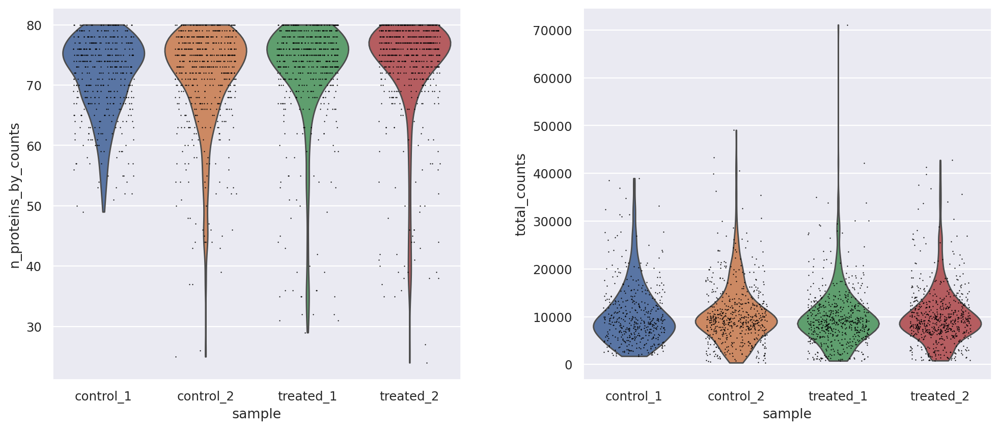

/tmp/ipykernel_1998699/987094685.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  molecule_rank_df["rank"] = molecule_rank_df.groupby(["sample"])["molecules"].rank(
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/pixelator/plot/__init__.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  edge_rank_df["rank"] = edge_rank_df.groupby([group_by])["molecules"].rank(


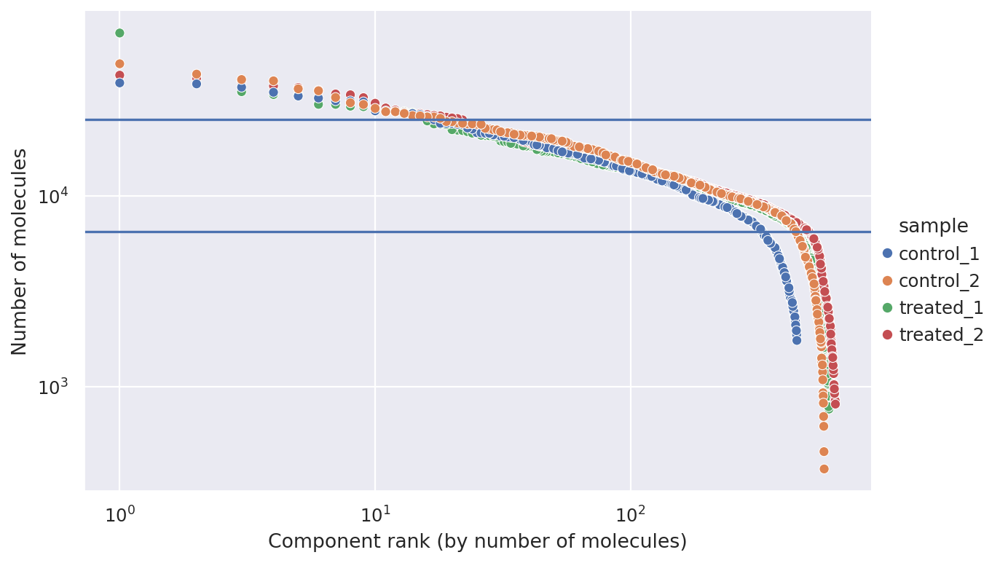

In [110]:
sc.pl.violin(
    adata,
    ["n_proteins_by_counts", "total_counts",],
    groupby='sample',
    jitter=0.3,
    multi_panel=True,
)

molecule_rank_df = adata.obs[["sample", "molecules"]].copy()
molecule_rank_df["rank"] = molecule_rank_df.groupby(["sample"])["molecules"].rank(
    ascending=False, method="first"
)
fig_intersection, ax = molecule_rank_plot(molecule_rank_df, group_by="sample")
high = 25000
low = 6500

ax.axhline(y=high)
ax.axhline(y=low)

# var_genes = sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=20, batch_key=batch_key, layer='counts', inplace=False)
# sc.pl.highly_variable_genes(var_genes, show=True, log=True)

/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/pixelator/plot/__init__.py:271: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(color_by).size().reset_index(name="n")


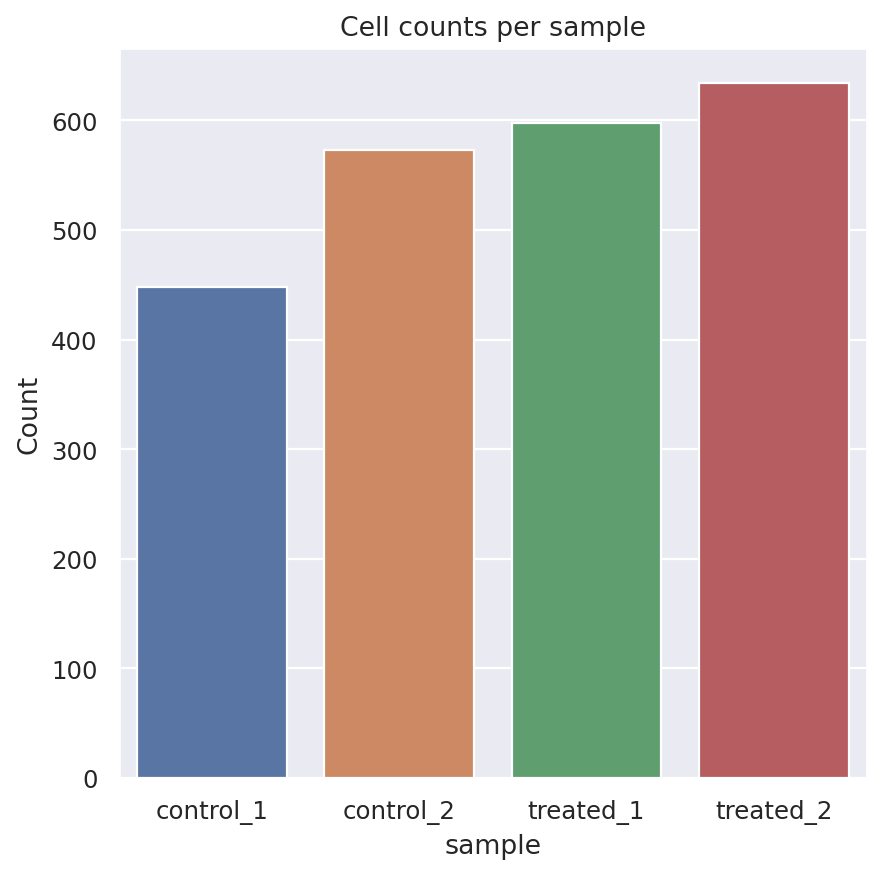

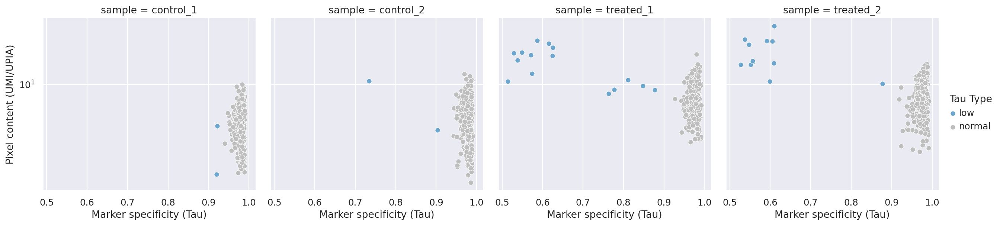

In [111]:
fig, ax = cell_count_plot(adata.obs, color_by="sample")

tau_metrics_df = adata.obs[["sample", "tau", "mean_molecules_per_a_pixel", "tau_type"]]
tau_metrics_df = tau_metrics_df.rename(columns={"mean_molecules_per_a_pixel": "umi_per_upia"})


fig, ax = scatter_umi_per_upia_vs_tau(tau_metrics_df, group_by="sample")

In [112]:
components = adata.obs[
    (adata.obs['tau_type'] == 'normal') & 
    (adata.obs['molecules'] > low) & 
    (adata.obs['molecules'] < high)
].index
vars = adata.var_names
adata = orig_adata[components, vars]

In [113]:
adata.layers['counts'] = adata.X.copy()
adata.layers['dsb'] = dsb_normalize(adata.to_df('counts'), isotype_controls=['mIgG1', 'mIgG2a', 'mIgG2b'])
adata.layers['clr']= clr_transformation(adata.to_df('counts'), axis=1)
adata.layers['clr_by_ab'] = clr_transformation(adata.to_df('counts'), axis=0)
adata.layers['log1p'] = np.log1p(adata.to_df('counts'))

/tmp/ipykernel_1998699/1007100254.py:1: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers['counts'] = adata.X.copy()


<Axes: xlabel='CD3E', ylabel='Count'>

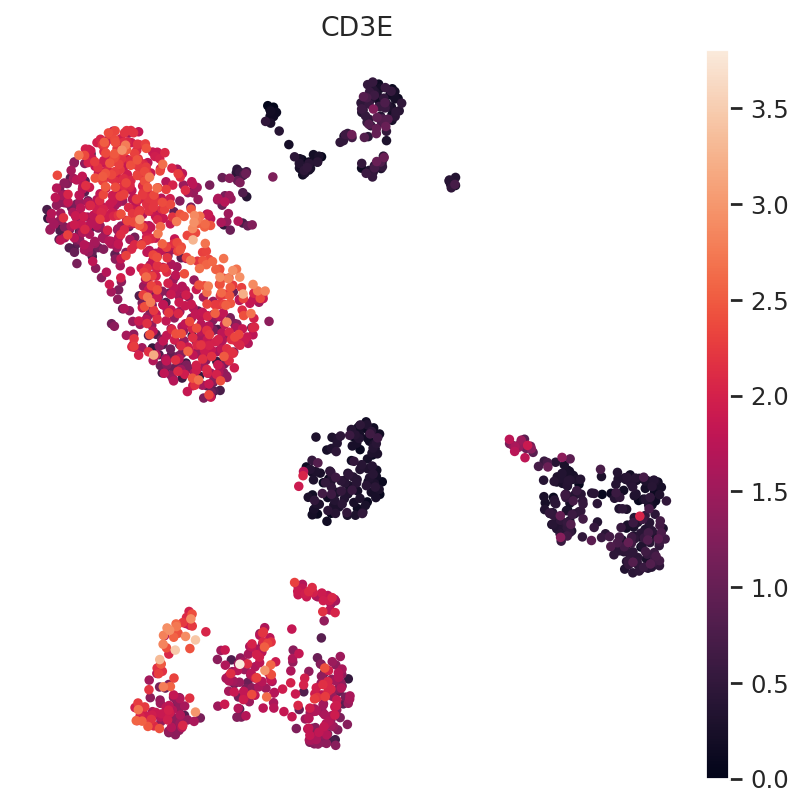

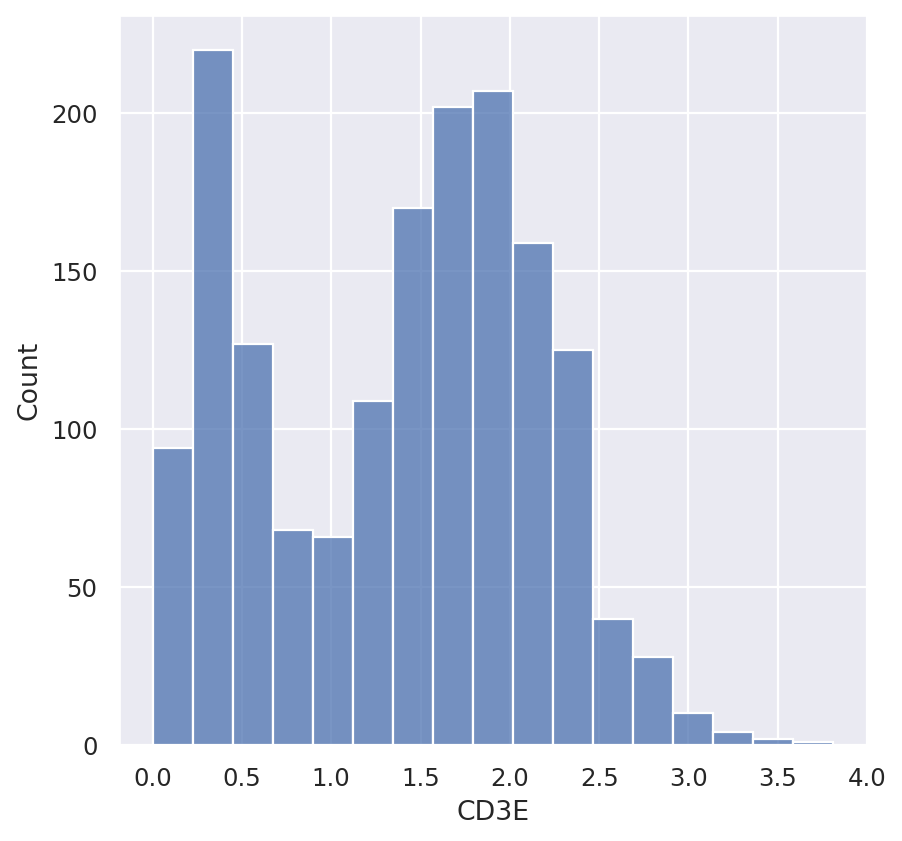

In [114]:
_ = pca_neighbors_umap(adata, 'clr', umap_pl_kwargs=dict(color=['CD3E'], layer='clr'))
sns.histplot(adata.to_df('clr')['CD3E'], ax=plt.subplots(1)[1])

### Filter only T cells for proper comparison to treated condition

In [121]:
clr = adata.to_df('clr')
t_cells = (clr[clr['CD3E'] > 1]).index
print(f'{len(t_cells) / len(adata)} fraction of T cells')
adata = adata[t_cells, :]

adata.layers['unfiltered_dsb'] = adata.layers['dsb']
adata.layers['unfiltered_clr_by_ab'] = adata.layers['clr_by_ab']
adata.layers['unfiltered_clr'] = adata.layers['clr']

# Recompute normalization
adata.layers['dsb'] = dsb_normalize(adata.to_df('counts'), isotype_controls=['mIgG1', 'mIgG2a', 'mIgG2b'])
adata.layers['clr'] = clr_transformation(adata.to_df('counts'), axis=1)
adata.layers['clr_by_ab'] = clr_transformation(adata.to_df('counts'), axis=0)


0.6727941176470589 fraction of T cells


/tmp/ipykernel_1998699/4073366633.py:6: ImplicitModificationWarning: Setting element `.layers['unfiltered_dsb']` of view, initializing view as actual.
  adata.layers['unfiltered_dsb'] = adata.layers['dsb']


/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/pixelator/plot/__init__.py:271: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(color_by).size().reset_index(name="n")


[]

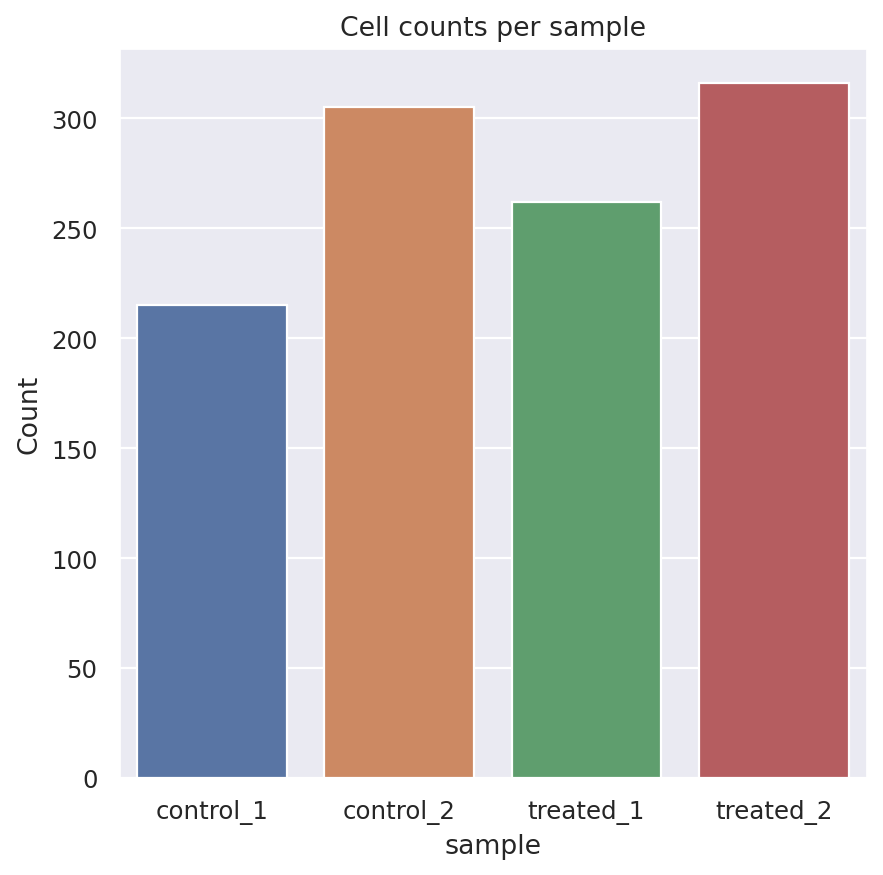

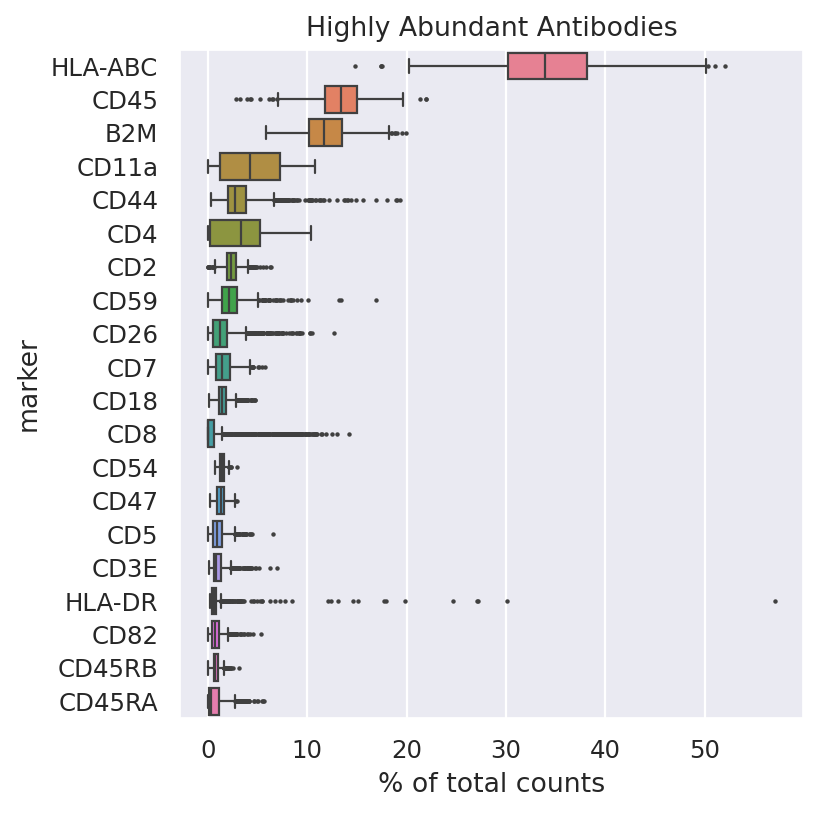

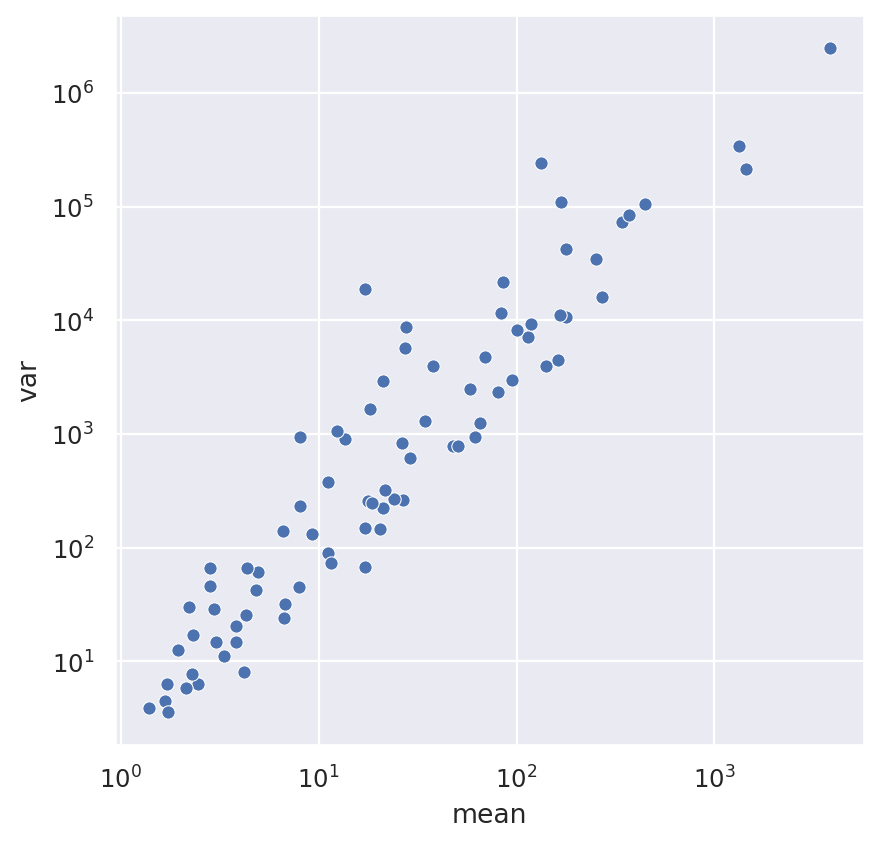

In [122]:
fig, ax = cell_count_plot(adata.obs, color_by="sample")

ax = sc.pl.highest_expr_genes(adata, n_top=20, show=False)
ax.set_title('Highly Abundant Antibodies')
stats = adata.to_df().agg(['mean', 'var',], axis=0).T
fig, ax = plt.subplots(1)
sns.scatterplot(x=stats['mean'], y=stats['var'], ax=ax)
ax.loglog()

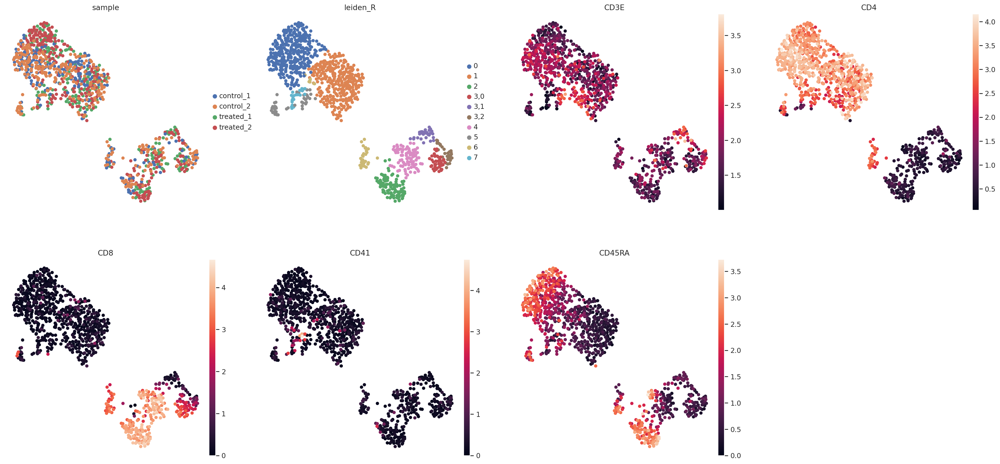

In [127]:
sc.pp.pca(adata, layer='clr')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5, random_state=0)
sc.tl.leiden(adata, restrict_to=('leiden', ['3',]), key_added='leiden_R', resolution=0.5, random_state=0)
leiden_key = 'leiden_R'
sc.pl.umap(adata, layer='clr', color=['sample', leiden_key, 'CD3E', 'CD4', 'CD8', 'CD41', 'CD45RA'])

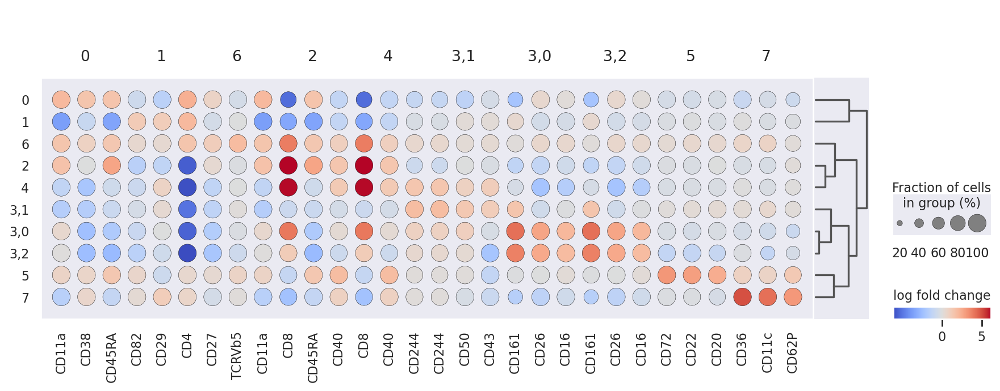

In [128]:
sc.tl.rank_genes_groups(adata, groupby=leiden_key, layer='log1p', method='wilcoxon', groups='all', reference='rest', use_raw=False)
sc.pl.rank_genes_groups_dotplot(adata, groupby=leiden_key, values_to_plot='logfoldchanges', n_genes=3, min_logfoldchange=1, vcenter=0, cmap='coolwarm')

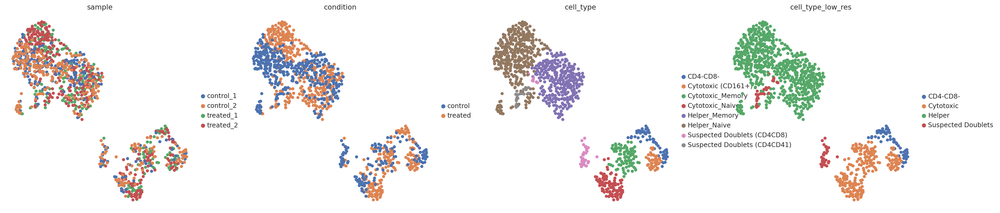

In [129]:
# annot_dict_reverse = {'T_Helper': ['0','1', '4-2,2'], 'T_Cytotoxic': ['3','4-2,0', '5'], 'T_DN': ['4-2,3'], 'T_DP': ['4-2,1']}
# annot_dict = {id: cell_type for (cell_type, ids) in annot_dict_reverse.items() for id in ids}
annot_dict = {
    '0': 'Helper_Naive',
    '5': 'Helper_Naive',
    '1': 'Helper_Memory',

    '6': 'Suspected Doublets (CD4CD8)',
    '7': 'Suspected Doublets (CD4CD41)',

    '2': 'Cytotoxic_Naive',
    '4': 'Cytotoxic_Memory',
    '3,0': 'Cytotoxic (CD161+)',

    '3,1': 'CD4-CD8-',
    '3,2': 'CD4-CD8-',
    
}

annot_low_res_dict = {
    '0': 'Helper',
    '5': 'Helper',
    '1': 'Helper',

    '6': 'Suspected Doublets',
    '7': 'Suspected Doublets',

    '2': 'Cytotoxic',
    '4': 'Cytotoxic',
    '3,0': 'Cytotoxic',

    '3,1': 'CD4-CD8-',
    '3,2': 'CD4-CD8-',
}


adata.obs['cell_type'] = adata.obs[leiden_key].map(annot_dict)

adata.obs['cell_type_low_res'] = adata.obs[leiden_key].map(annot_low_res_dict)

sample_to_condition = {'treated_1': 'treated', 'treated_2': 'treated', 'control_1': 'control', 'control_2': 'control'}
adata.obs['condition'] = adata.obs['sample'].map(sample_to_condition)

sc.pl.umap(adata, color=['sample', 'condition', 'cell_type', 'cell_type_low_res'])

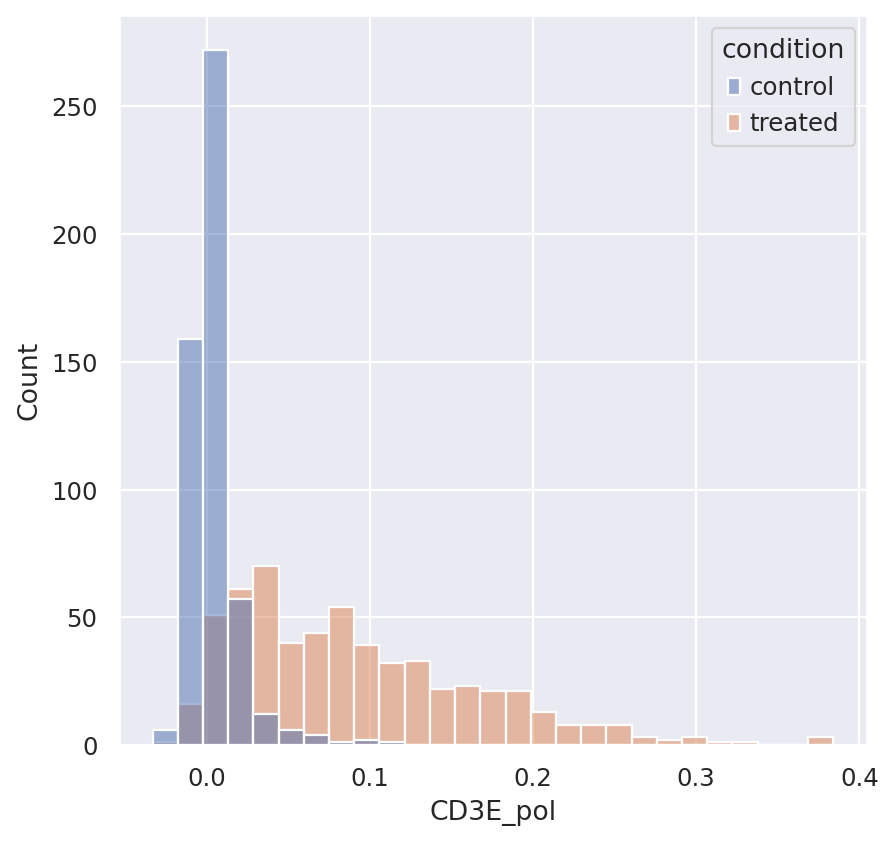

In [131]:
vars = [v for v in adata.var_names if v not in ['mIgG1', 'mIgG2a', 'mIgG2b']]

polarization_i = convert_polarization_to_feature_matrix(pg_data.polarization, components=adata.obs.index, key='morans_i', vars=vars)
polarization_z = convert_polarization_to_feature_matrix(pg_data.polarization, components=adata.obs.index, key='morans_z', vars=vars)

coloc_p = convert_colocalization_to_feature_matrix(pg_data.colocalization, components=adata.obs.index, key='pearson', vars=vars)
coloc_z = convert_colocalization_to_feature_matrix(pg_data.colocalization, components=adata.obs.index, key='pearson_z', vars=vars)
adata.obsm['pol_i'] = polarization_i
adata.obsm['pol_z'] = polarization_z
adata.obsm['coloc_p'] = coloc_p
adata.obsm['coloc_z'] = coloc_z

adata.obs['CD3E_pol'] = adata.obsm['pol_i']['CD3E_pol']

sns.histplot(adata.obs, x='CD3E_pol', hue='condition')

# Unit: in [0,1]
for key in ('pol_i',):
    adata.obsm[f'{key}_unit'] = (1 + adata.obsm[key]) / 2

# Standardization and variance filtering
pol = adata.obsm['pol_i_unit']
pol_std = (pol - pol.mean(axis=0)) / pol.std(axis=0)
pol_std_arcsinh = np.arcsinh(pol_std)

pol_hvg = pol.loc[:, pol.std(axis=0) > 0.01]
pol_hvg_std = (pol_hvg - pol_hvg.mean(axis=0)) / pol_hvg.std(axis=0)
pol_hvg_std_arcsinh = np.arcsinh(pol_hvg_std)

adata.obsm['pol_hvg_unit'] = pol_hvg
adata.obsm['pol_hvg_std'] = pol_hvg_std_arcsinh

add_one_hot_encoding_obsm(adata, obs_column='cell_type')


## After Preprocessing

In [182]:
# adata.write_h5ad(DATA_DIR / 'cd3_combined_annotated_with_pol.h5ad')
adata = anndata.read_h5ad(DATA_DIR / 'cd3_combined_annotated_with_pol.h5ad')

In [183]:
ab_layer = 'clr'
pol_key = 'pol_hvg_std'

In [184]:
obs = adata.obs.drop(columns='CD3E_pol')
pol_adata = anndata.AnnData(
    X=adata.obsm['pol_i'],
    obs=obs,
    layers={
        'pol_i': adata.obsm['pol_i'],
        'pol_i_unit': adata.obsm['pol_i_unit'],
        # 'scaled': adata.obsm['pol_i_scaled']
    }
)

pol_hvg_adata = anndata.AnnData(
    X=adata.obsm['pol_hvg_unit'],
    obs=obs,
    layers={
        'pol_hvg_unit': adata.obsm['pol_hvg_unit'],
        'pol_hvg_std': adata.obsm['pol_hvg_std'],
    }
)

# coloc_adata = anndata.AnnData(
#     X=adata.obsm['coloc_p'],
#     obs=adata.obs,
#     layers={'unit': adata.obsm['coloc_p_unit'],
#             'scaled': adata.obsm['coloc_p_scaled']
#             }
# )
# coloc_hv_adata = anndata.AnnData(
#     X=adata.obsm['coloc_p_hv'],
#     obs=adata.obs,
#     layers={'unit': adata.obsm['coloc_p_hv_unit'],
#             'scaled': adata.obsm['coloc_p_hv_scaled']
#             }
# )
# joint_adata = anndata.AnnData(
#     X=pd.concat((adata.to_df('dsb'), adata.obsm['polarization_morans_i']), axis=1),
#     obs=adata.obs
# )

In [185]:
adata.obsm['abundance_pol'] = pd.concat(
    (adata.to_df(ab_layer), adata.obsm[pol_key]),
    axis=1,
)
calc_PCA(adata, rep='abundance_pol', key_added='abundance_pol')
calc_PCA(adata, rep=ab_layer, key_added=ab_layer)

### PCA
In the abundance + pol PCA, conditions are pretty well separated

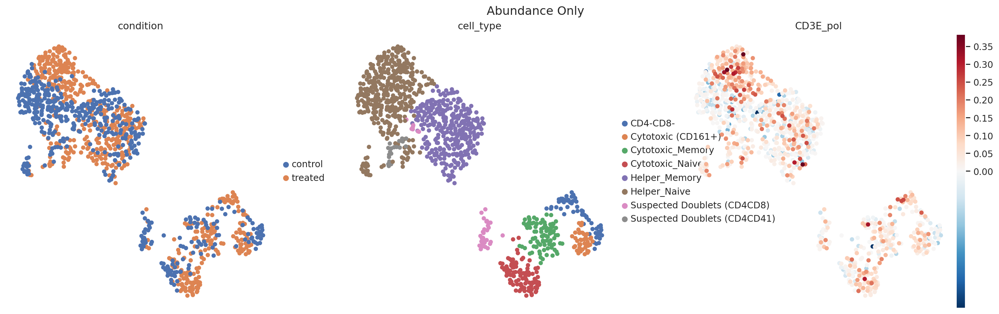

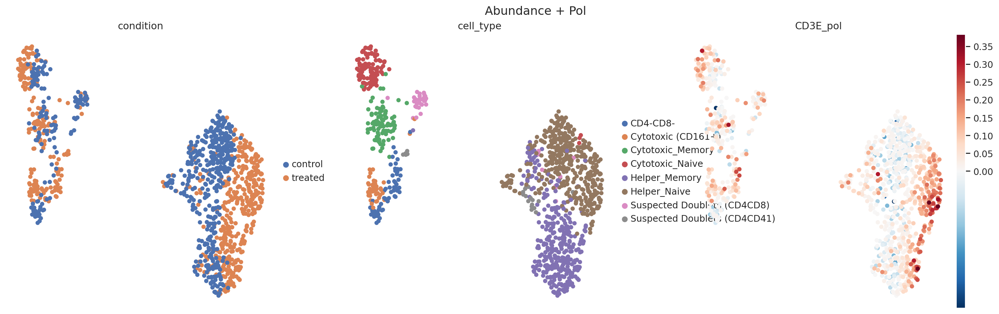

In [186]:
_ = pca_neighbors_umap(adata, ab_layer, umap_pl_kwargs=dict(layer=ab_layer, color=['condition', 'cell_type', 'CD3E_pol'], vcenter=0, cmap=CMAP), umap_title='Abundance Only')
_ = pca_neighbors_umap(adata, 'abundance_pol', umap_pl_kwargs=dict(layer=ab_layer, color=['condition', 'cell_type', 'CD3E_pol'], vcenter=0, cmap=CMAP), umap_title='Abundance + Pol')

## Abundance Model

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' d

Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 200 records. Best score: -12.044. Signaling Trainer to stop.


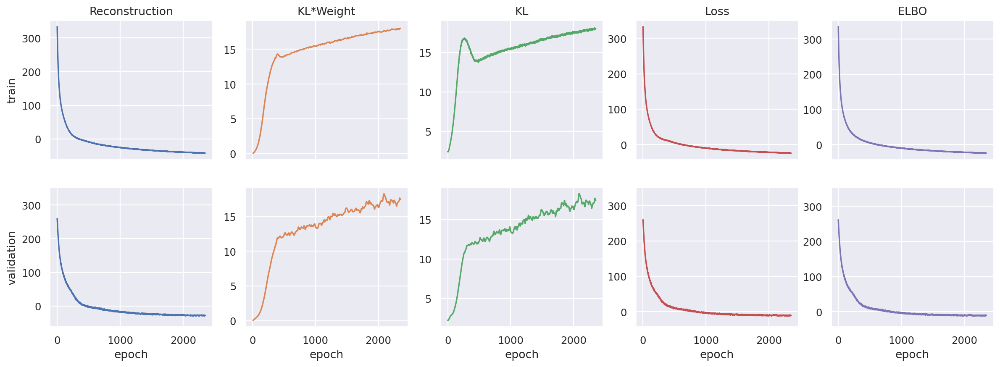

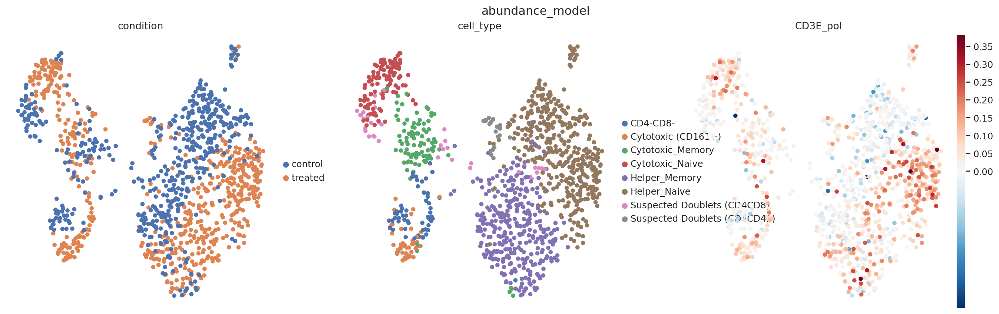

In [187]:
model_cls = MultiModalSCVI
setup_kwargs = dict(layer=ab_layer, batch_key=None)
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=200, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))
model_kwargs = dict(n_latent=20, n_hidden=128, n_layers=1, dropout_rate=0.1, distrs=[D.Normal,],)
modalities_latent_names=[(ab_layer, 'abundance_model')]
abundance_model = train_model(adata, model_cls=model_cls, setup_kwargs=setup_kwargs, model_kwargs=model_kwargs, train_kwargs=train_kwargs,)
get_model_latents(adata, abundance_model, modalities_latent_names=modalities_latent_names)
for key, name in modalities_latent_names:
    title = name
    fig = pca_neighbors_umap(adata, name, umap_pl_kwargs=dict(color=['condition', 'cell_type', 'CD3E_pol',], vcenter=0, cmap='RdBu_r', layer=ab_layer)).suptitle(title)

## Polarization-only

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' d

Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 200 records. Best score: 12.425. Signaling Trainer to stop.


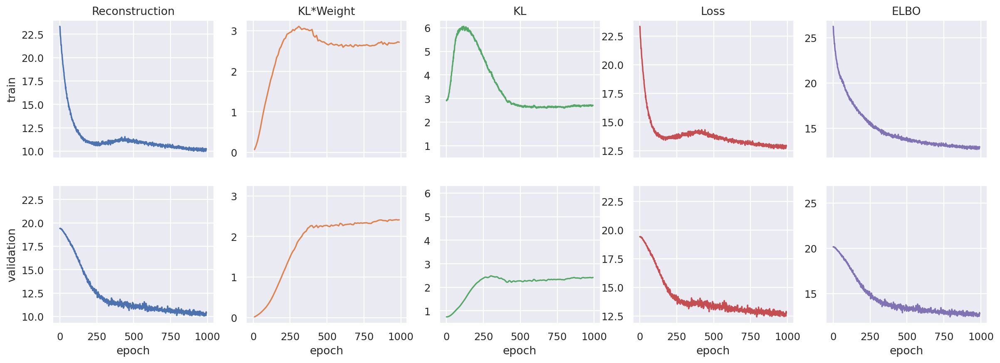

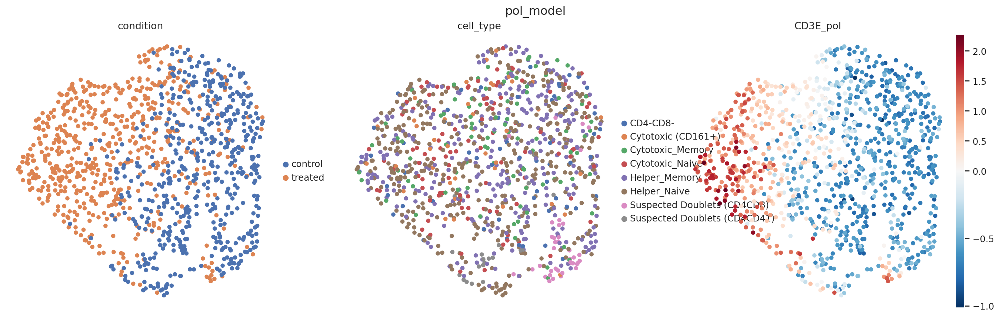

In [188]:
model_cls = MultiModalSCVI

setup_kwargs = dict(layer=pol_key, extra_modality_keys=[], n_modalities=1, batch_key=None, )
model_kwargs = dict(n_latent=20, n_hidden=128, n_layers=2, dropout_rate=0.1, 
                        distrs=[D.Normal], 
                        joint_kl=False, unimodal_kl=True,
                        external_kl_weight=1, decoder_kwargs=dict(decoder_param_eps=1e-2, decoder_activation='exp'),
                    )
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=200, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))

latent_name = 'pol_model'
modalities_latent_names=[(pol_key, latent_name)]
pol_model = train_model(pol_hvg_adata, model_cls=model_cls, setup_kwargs=setup_kwargs, model_kwargs=model_kwargs, train_kwargs=train_kwargs)
get_model_latents(pol_hvg_adata, pol_model, modalities_latent_names=modalities_latent_names)
for key, name in modalities_latent_names:
    title = name
    fig = pca_neighbors_umap(pol_hvg_adata, name, umap_pl_kwargs=dict(color=['condition', 'cell_type', 'CD3E_pol',], vcenter=0, cmap='RdBu_r', layer=pol_key)).suptitle(title)

## Abundance + Pol Model

### Separate Encoders, Learned Global Weights
Achieves nice separation for both dsb and pol

INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' d

Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 200 records. Best score: -6.211. Signaling Trainer to stop.


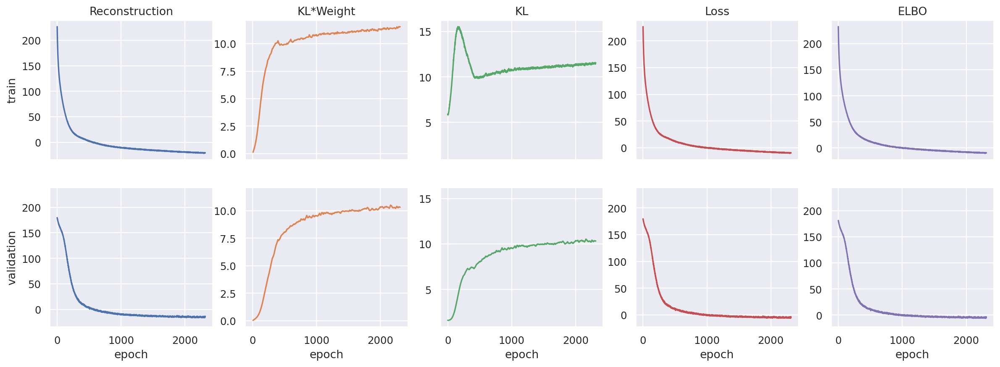

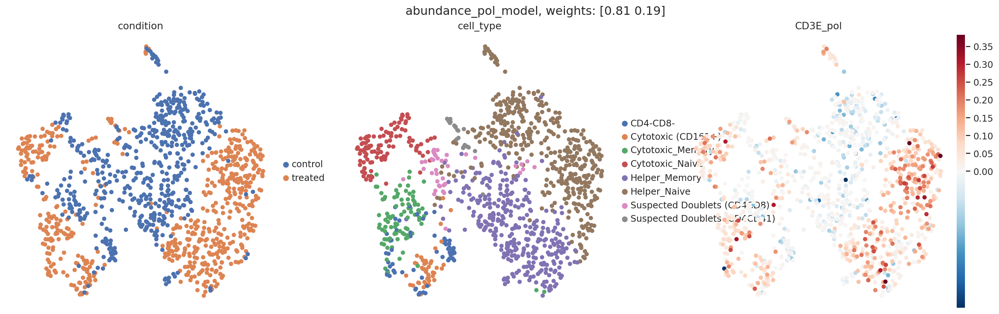

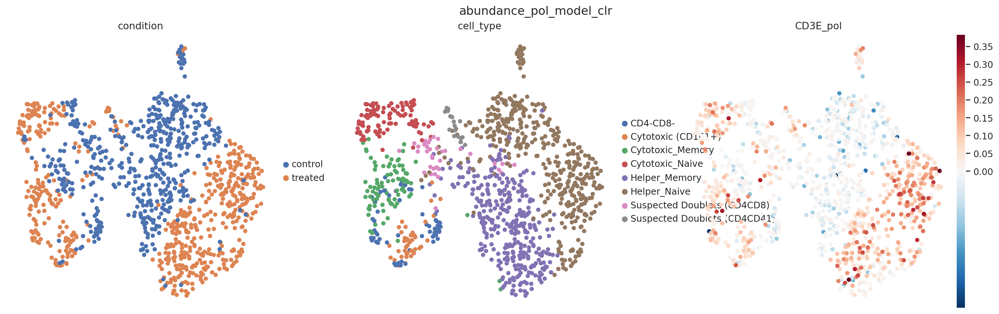

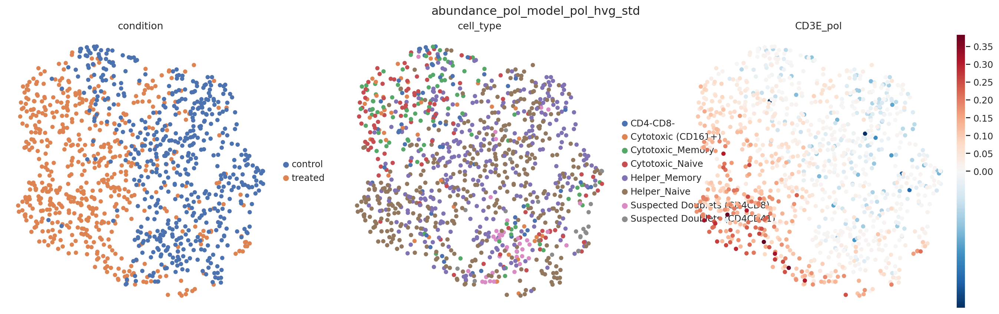

In [189]:
model_cls = MultiModalSCVI

latent_name = 'abundance_pol_model'

setup_kwargs = dict(layer=ab_layer, extra_modality_keys=[pol_key], n_modalities=2, batch_key=None, )
model_kwargs = dict(n_latent=20, n_hidden=128, n_layers=2, dropout_rate=0.1, 
                        distrs=[D.Normal, D.Normal], 
                        agg_method=AggMethod.AOE_GLOBAL_WEIGHTS,
                        joint_kl=False, unimodal_kl=True,
                        decoder_kwargs=dict(decoder_param_eps=1e-2, decoder_activation='exp'),
                    )
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=200, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))
modalities_latent_names=[('joint', latent_name), (ab_layer, f'{latent_name}_{ab_layer}'), (pol_key, f'{latent_name}_{pol_key}')]
abundance_pol_model = train_model(adata, model_cls=model_cls, setup_kwargs=setup_kwargs, model_kwargs=model_kwargs, train_kwargs=train_kwargs,)
weights = abundance_pol_model.get_weights()
get_model_latents(adata, abundance_pol_model, modalities_latent_names=modalities_latent_names)
for key, name in modalities_latent_names:
    title = name if key != 'joint' else f'{name}, weights: {np.array2string(weights, precision=2)}'    
    fig = pca_neighbors_umap(adata, name, umap_pl_kwargs=dict(color=['condition', 'cell_type', 'CD3E_pol',], vcenter=0, cmap='RdBu_r', layer=ab_layer)).suptitle(title)

### Shared Encoder

INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' d

Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 200 records. Best score: -9.112. Signaling Trainer to stop.


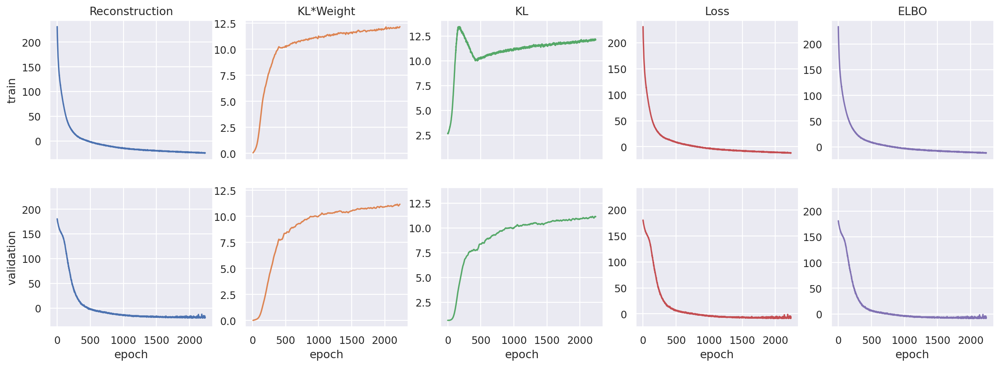

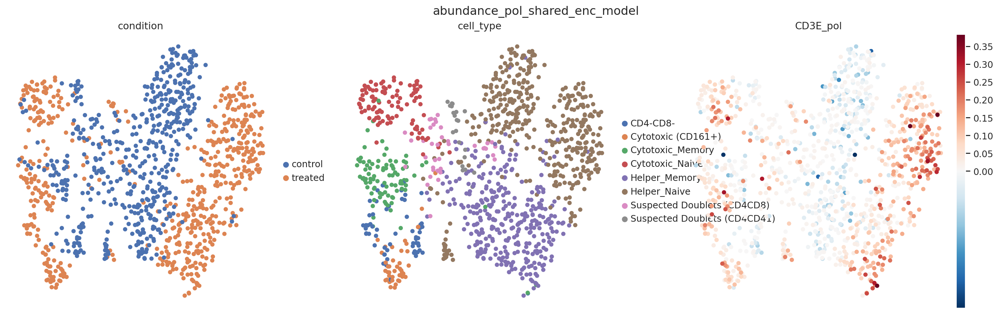

In [190]:
model_cls = MultiModalSCVI

latent_name = 'abundance_pol_shared_enc_model'

setup_kwargs = dict(layer=ab_layer, extra_modality_keys=[pol_key], n_modalities=2, batch_key=None, )
model_kwargs = dict(n_latent=20, n_hidden=128, n_layers=2, dropout_rate=0.1, 
                        distrs=[D.Normal, D.Normal], 
                        agg_method=AggMethod.SHARED_ENCODER,
                        joint_kl=True, unimodal_kl=False,
                        decoder_kwargs=dict(decoder_param_eps=1e-2, decoder_activation='exp')
                    )
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=200, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))
abundance_pol_shared_enc_model = train_model(adata, model_cls=model_cls, setup_kwargs=setup_kwargs, model_kwargs=model_kwargs, train_kwargs=train_kwargs,)

modalities_latent_names=[('joint', latent_name)]
get_model_latents(adata, abundance_pol_shared_enc_model, modalities_latent_names=modalities_latent_names)
for key, name in modalities_latent_names:
    title = name
    fig = pca_neighbors_umap(adata, name, umap_pl_kwargs=dict(color=['condition', 'cell_type', 'CD3E_pol',], vcenter=0, cmap='RdBu_r', layer=ab_layer)).suptitle(title)

### Shared Encoder - Using batch key

INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/projects/nyosef/eitangr/miniconda3/envs/pixelgen-scvi/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' d

Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 200 records. Best score: -8.301. Signaling Trainer to stop.


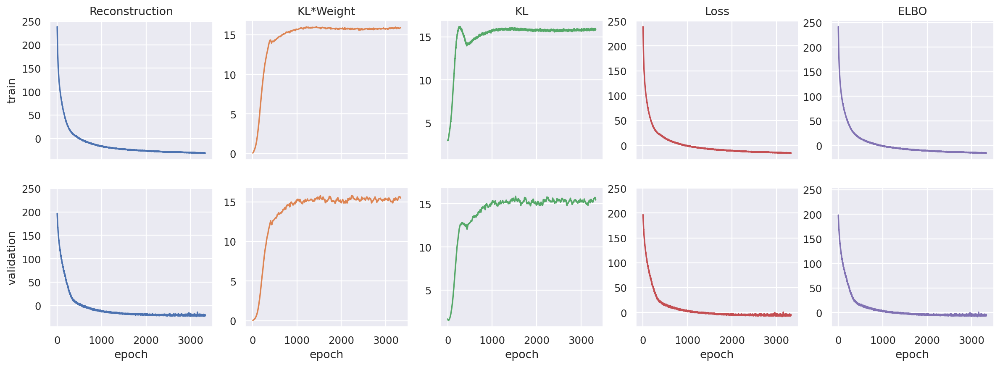

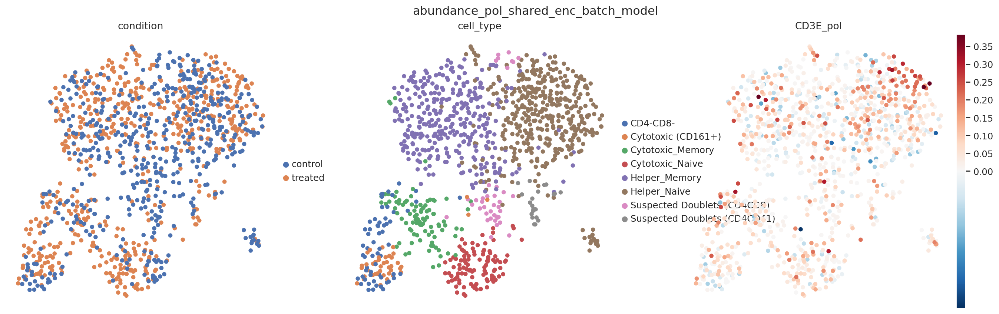

In [191]:
model_cls = MultiModalSCVI

latent_name = 'abundance_pol_shared_enc_batch_model'

setup_kwargs = dict(layer=ab_layer, extra_modality_keys=[pol_key], n_modalities=2, batch_key='sample', )
model_kwargs = dict(n_latent=20, n_hidden=128, n_layers=1, dropout_rate=0.1, 
                        distrs=[D.Normal, D.Normal], 
                        agg_method=AggMethod.SHARED_ENCODER,
                        joint_kl=True, unimodal_kl=False,
                        decoder_kwargs=dict(decoder_param_eps=1e-2, decoder_activation='exp')
                    )
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_monitor='elbo_validation',
                    early_stopping_patience=200, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))
modalities_latent_names=[('joint', latent_name),]
shared_enc_w_batch_model = train_model(adata, model_cls=model_cls, setup_kwargs=setup_kwargs, model_kwargs=model_kwargs, train_kwargs=train_kwargs, 
                    modalities_latent_names=modalities_latent_names)
get_model_latents(adata, shared_enc_w_batch_model, modalities_latent_names=modalities_latent_names)
for key, name in modalities_latent_names:
    title = name
    fig = pca_neighbors_umap(adata, name, umap_pl_kwargs=dict(color=['condition', 'cell_type', 'CD3E_pol',], vcenter=0, cmap='RdBu_r', layer=ab_layer)).suptitle(title)

## Metrics

In [192]:
metrics = MultiModalVIMetrics(
    adata,
    models = {
        'abundance_only': abundance_model,
        'global_weights': abundance_pol_model,
        'shared_enc': abundance_pol_shared_enc_model,
        'shared_enc_w_batch': shared_enc_w_batch_model,
        'pol_model': pol_model,
    },
    pca_key='abundance_pol_pca',
    additional_autocorr_keys=['cell_type'],
)
metrics.run()

Modalities indentified: ['clr', 'pol_hvg_std']
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              
INFO     Using column names from columns of adata.obsm['pol_hvg_std']                                              


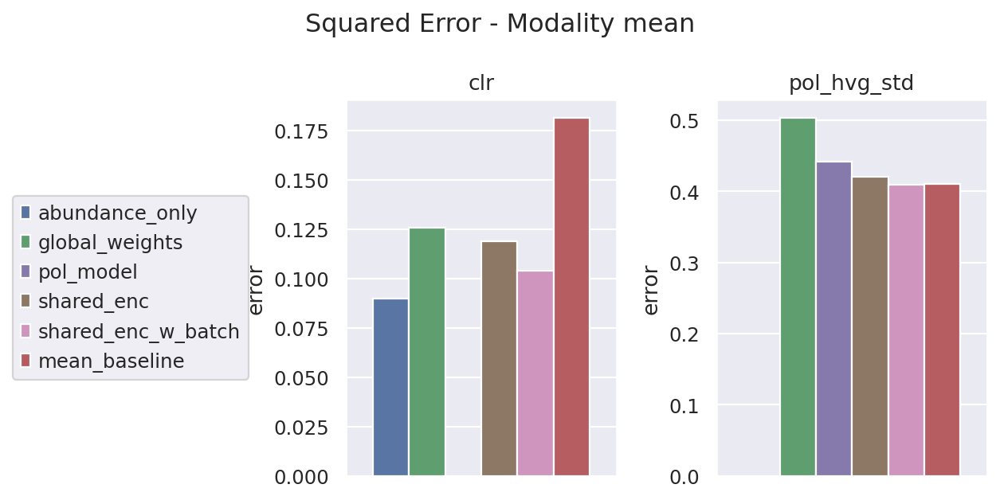

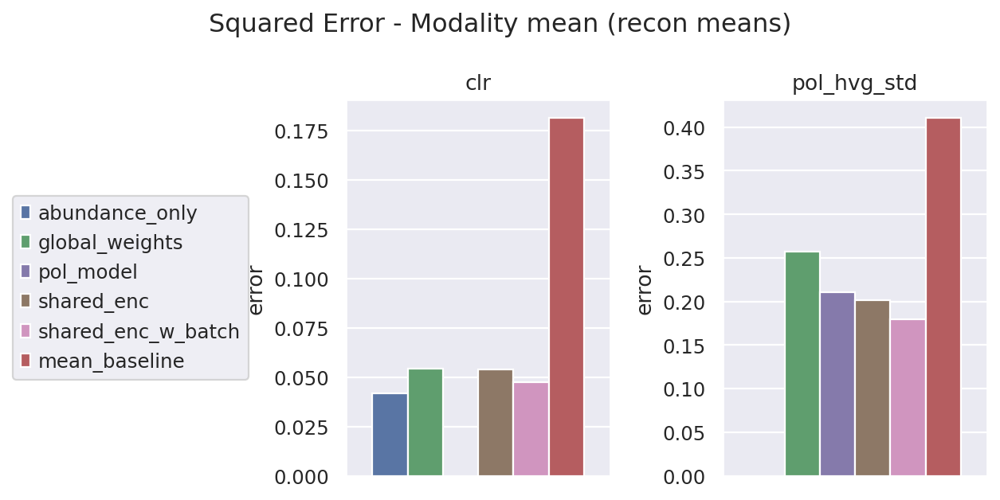

In [193]:
_ = metrics.mean_modality_errors_barplot()
_ = metrics.mean_modality_errors_barplot(reconstruction_mean=True)

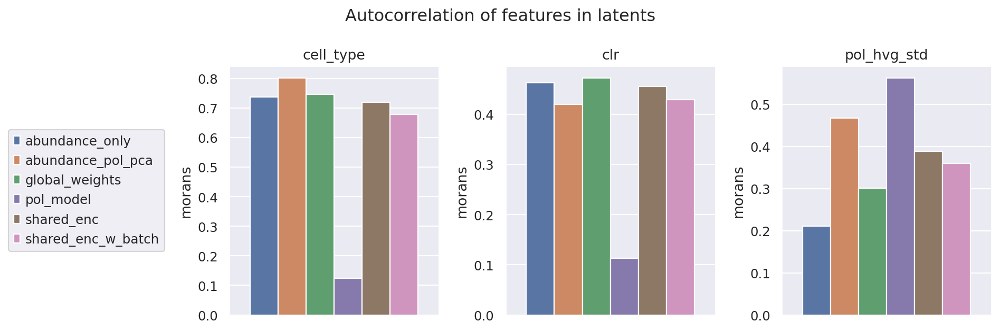

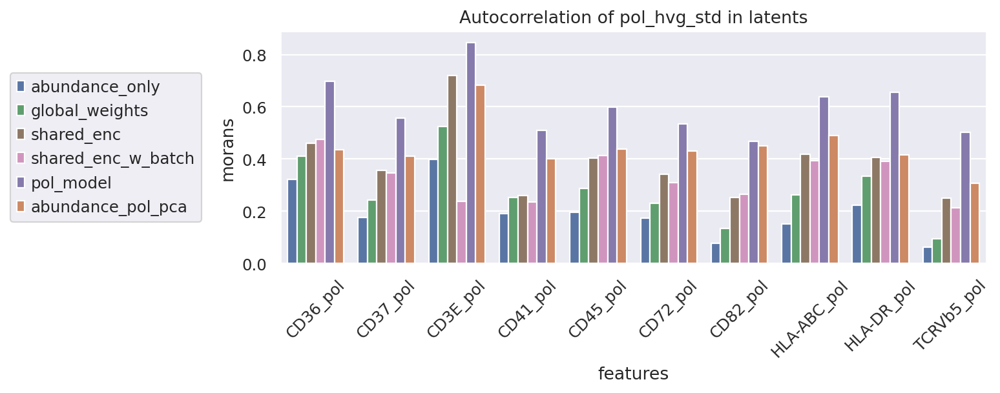

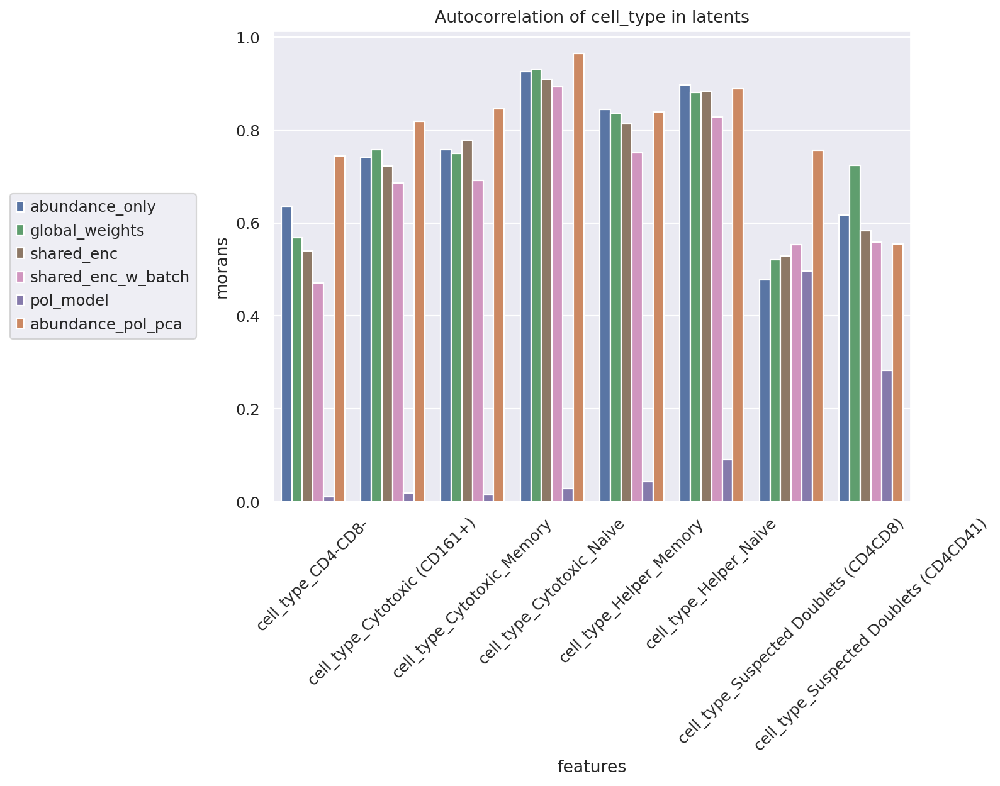

In [194]:
_ = metrics.mean_autocorr_barplot()
_ = metrics.autocorr_barplot(autocorr_key='pol_hvg_std', auto_filter_features=10)
_ = metrics.autocorr_barplot(autocorr_key='cell_type', auto_filter_features=10, figsize=(10, 8))

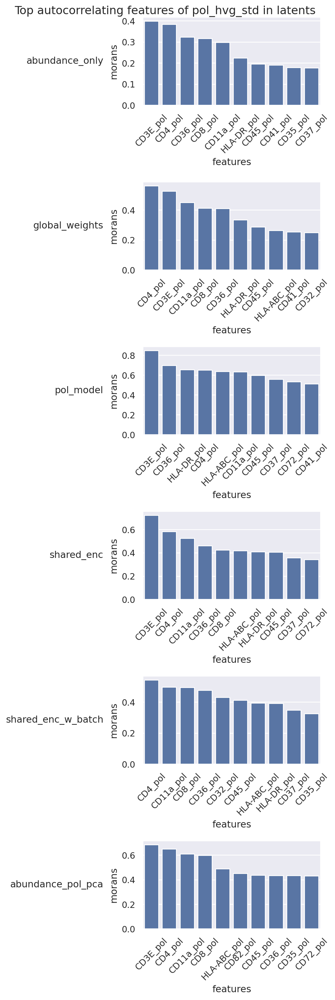

In [195]:
_ = metrics.top_autocorr_features_barplot(key='pol_hvg_std')

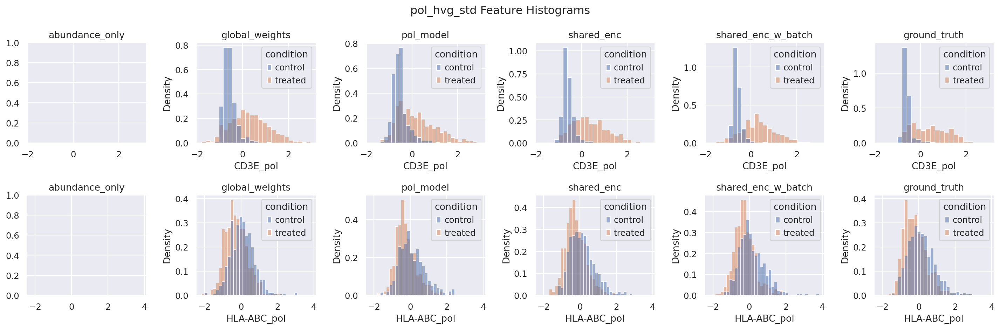

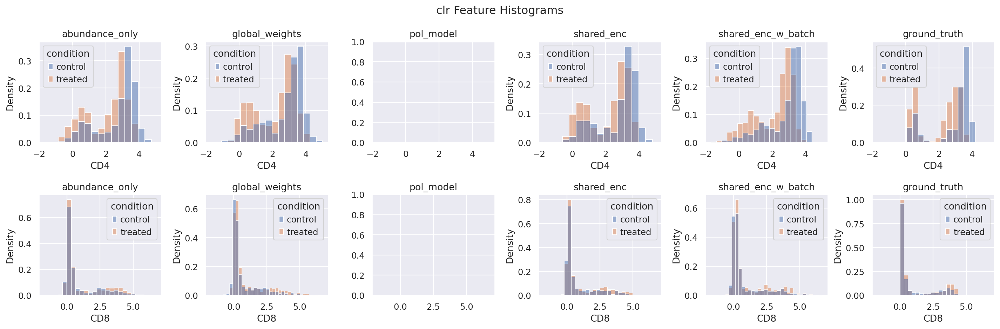

In [196]:
fig = metrics.feature_histplot(modality=pol_key, features=['CD3E_pol', 'HLA-ABC_pol'], hue='condition')
fig = metrics.feature_histplot(modality=ab_layer, features=['CD4', 'CD8'], hue='condition')